In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = 15, 5

In [2]:
images_names = glob.glob("../../images/tests/*.JPG")

In [3]:
def resize(image, dheight):
    h, w = image.shape[:2]
    dwidth = int((1. * dheight / h) * w)
    return cv2.resize(image, (dwidth, dheight))

In [25]:
def draw_contours(image):
    image_draw = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    _, contours, __ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for j in xrange(len(contours)):
        cv2.drawContours(image_draw, contours, j, (0, 255, 0), 2)
    return image_draw

In [30]:
def draw_max_contour(image):
    image_draw = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    _, contours, __ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(image_draw, contours, get_max_contour_id(contours), (0, 255, 0), 3)
    return image_draw

In [31]:
def get_max_contour_id(contours):
    max_area = -1
    max_id = 0
    for j in xrange(len(contours)):
        if cv2.contourArea(contours[j]) > max_area:
            max_area = cv2.contourArea(contours[j])
            max_id = j
    return max_id

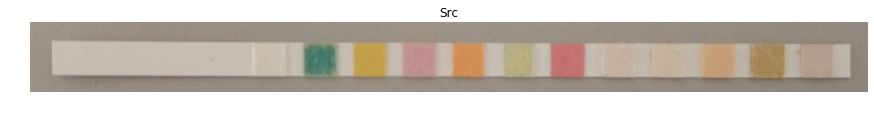

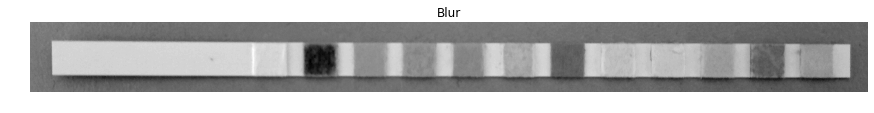

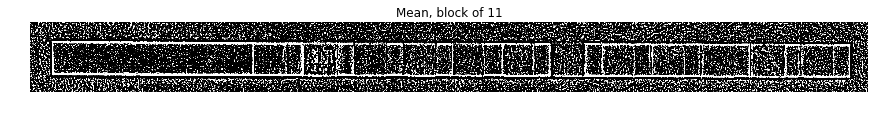

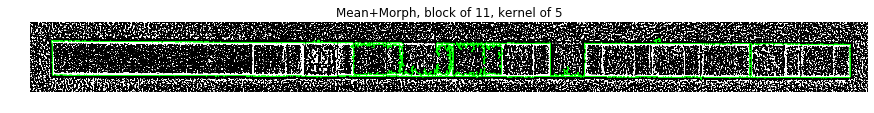

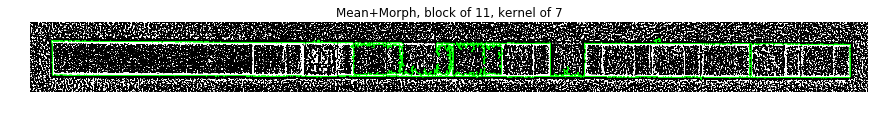

...

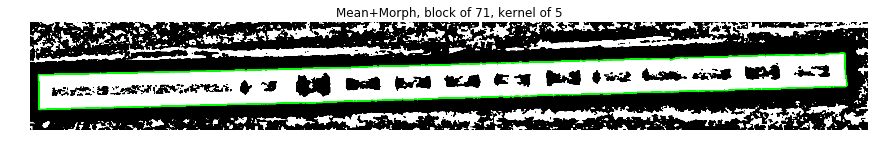

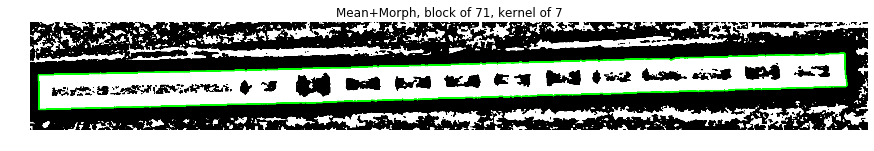

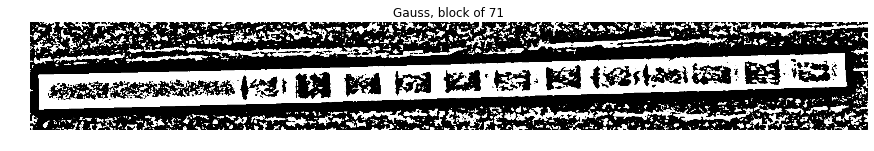

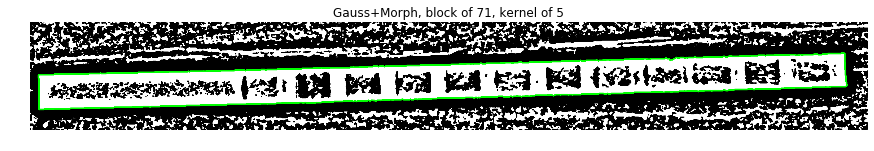

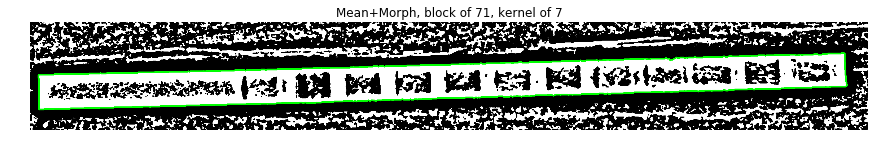

In [34]:
for image_name in images_names:
    
    image_rgb = cv2.cvtColor(cv2.imread(image_name, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    image_rgb = resize(image_rgb, 300)
    image_gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    image_blurred = cv2.bilateralFilter(image_gray, 5, 100, 100)
    
    plt.title('Src')
    plt.axis('off')
    plt.imshow(image_rgb)   
    plt.show()
    plt.title('Blur')
    plt.axis('off')
    plt.imshow(image_blurred, cmap='gray')
    plt.show()
    
    kernel0 = np.ones((3, 3))
    kernel1 = np.ones((5, 5))
    kernel2 = np.ones((7, 7))
    
    for block in [11, 31, 51, 71]:
        image_binary_ad1 = cv2.adaptiveThreshold(image_blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                                cv2.THRESH_BINARY, block, 0)
        image_binary_ad2 = cv2.adaptiveThreshold(image_blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                                cv2.THRESH_BINARY, block, 0)
        
        image_binary_mr11 = cv2.morphologyEx(image_binary_ad1, cv2.MORPH_OPEN, kernel1)
        image_binary_mr11 = cv2.morphologyEx(image_binary_ad1, cv2.MORPH_CLOSE, kernel0)
        image_binary_mr21 = cv2.morphologyEx(image_binary_ad2, cv2.MORPH_OPEN, kernel1) 
        image_binary_mr21 = cv2.morphologyEx(image_binary_ad2, cv2.MORPH_CLOSE, kernel0) 
        
        image_binary_mr12 = cv2.morphologyEx(image_binary_ad1, cv2.MORPH_OPEN, kernel2)
        image_binary_mr12 = cv2.morphologyEx(image_binary_ad1, cv2.MORPH_CLOSE, kernel0)
        image_binary_mr22 = cv2.morphologyEx(image_binary_ad2, cv2.MORPH_OPEN, kernel2)
        image_binary_mr22 = cv2.morphologyEx(image_binary_ad2, cv2.MORPH_CLOSE, kernel0)
        
        
        image_binary_mr11_cnt = draw_max_contour(image_binary_mr11)
        image_binary_mr21_cnt = draw_max_contour(image_binary_mr21)
        image_binary_mr12_cnt = draw_max_contour(image_binary_mr12)
        image_binary_mr22_cnt = draw_max_contour(image_binary_mr22)
        
        plt.title('Mean, block of {}'.format(block))
        plt.axis('off')
        plt.imshow(image_binary_ad1, cmap='gray')
        plt.show()
        plt.title('Mean+Morph, block of {}, kernel of {}'.format(block, 5))
        plt.axis('off')
        plt.imshow(image_binary_mr11_cnt)
        plt.show()
        plt.title('Mean+Morph, block of {}, kernel of {}'.format(block, 7))
        plt.axis('off')
        plt.imshow(image_binary_mr12_cnt)
        plt.show()
        plt.title('Gauss, block of {}'.format(block))
        plt.axis('off')
        plt.imshow(image_binary_ad2, cmap='gray')
        plt.show()
        plt.title('Gauss+Morph, block of {}, kernel of {}'.format(block, 5))
        plt.axis('off')
        plt.imshow(image_binary_mr21_cnt)
        plt.show()
        plt.title('Mean+Morph, block of {}, kernel of {}'.format(block, 7))
        plt.axis('off')
        plt.imshow(image_binary_mr22_cnt)
        plt.show()

Резюме:
* с размером блока для локальной бинаризации порядка 10 (при ширине изображения в 300) во всех случах кроме одного удается оконтурить прямоугольник полоски, при дальнейшем увеличении результат становится только "увереннее"
* размер структурного элемента для морфологии практически не влияет на результат (5, 7)
* для изображений со светлым фоном (примерно белого цвета полоски) и с фоном, совпадающим по цвету с одной из тестовых ячеек, контур ожидаемо разрывается

Пайплайн: (размер полоски ~ 150 пикселей в ширину, это надо учитывать)
1. Перевод в gray
2. Билатеральный фильтр
3. Адаптивный порог с блоком ~31 пиксель
4. Морфология: открытие с (5х5), закрытие с (3х3)
5. Контуры
...